In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.decomposition import PCA

In [2]:
def load_data(filename):
    raw = np.genfromtxt(filename, delimiter=',')
    raw = raw[:, :-1]
    #print(raw)
    #print(raw.shape)
    return raw

In [3]:
def pre_ave_std(raw):
    ave = np.mean(raw, axis=0)
    std = np.std(raw, axis=0)
    de = []
    for i in range(raw.shape[0]):
        for j in range(raw.shape[1]):
            if (raw[i][j] > (ave[j] + 3 * std[j])) | (raw[i][j] < (ave[j] - 3 * std[j])):
                de.append(i)
                break
    preprocess = np.delete(raw, de, 0)
    print(preprocess.shape)
    return preprocess

In [4]:
# old
def pre_slope_std(raw):
    std = np.std(raw, axis=0)
    de = []
    for i in range(raw.shape[0] - 1):
        for j in range(raw.shape[1]):
            if abs(raw[i + 1][j] - raw[i][j]) > 3.5 * std[j] :
                de.append(i + 1)
                break
    preprocess = np.delete(raw, de, 0)
    print(preprocess.shape)
    return preprocess

In [4]:
# new
def pre_slope_std(raw):
    std = np.std(raw, axis=0)
    de = []
    i = 0
    i_max = raw.shape[0]
    i_flag = 0
    i_tf = False
    while i < i_max - 1:
        for j in range(raw.shape[1]):
            if abs(raw[i + 1][j] - raw[i_flag][j]) > 3 * std[j] :
                de.append(i + 1)
                i_tf = True
                break
        i = i + 1
        if not i_tf:
            i_flag = i
        i_tf = False
            
    preprocess = np.delete(raw, de, 0)
    #print(preprocess.shape)
    return preprocess

In [9]:
def draw(raw, preprocess):
    print(raw.shape, preprocess.shape)
    plt.figure(2, figsize=(20,16))
    plt.subplot(211)
    f1 = plt.plot(raw)
    plt.subplot(212)
    f2 = plt.plot(preprocess)

In [5]:
def pre_save(preprocess, dir_path, data_path):
    try:
        os.mkdir(dir_path, mode=0o775)
    except:
        print("dir exists!!")
    if os.path.exists(data_path):
        print("file exists!!")
    np.savetxt(data_path, preprocess, delimiter=",", fmt='%.4f')

In [6]:
def cap_save(preprocess, data_path):
    if os.path.exists(data_path):
        print("file exists!!")
    np.savetxt(data_path, preprocess, delimiter=",", fmt='%.4f')

In [ ]:
f = plt.plot(raw[100:200])

In [38]:
def pca(data,n):
    Pca = PCA(n_components=n)
    Pca.fit(data)
    print(Pca.explained_variance_ratio_)
    return Pca

(4610, 56) (4526, 56)


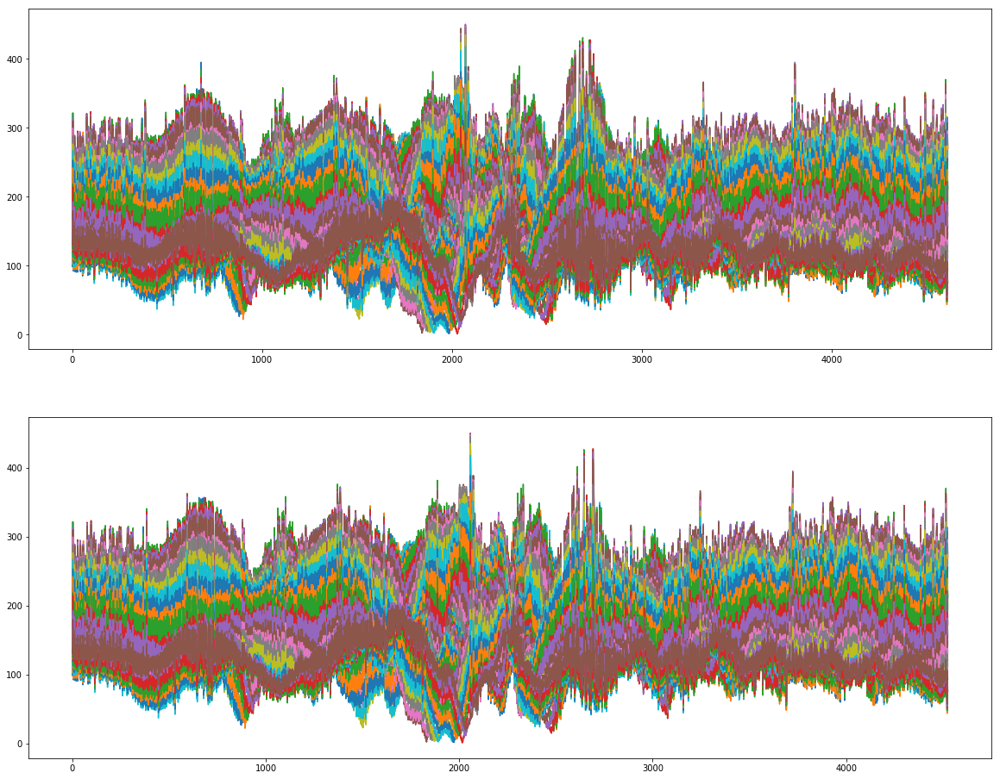

In [10]:
# data test -- don't run
TX = 1
RX = 3
data_num = 58
action = "walk"
filename = "data/" + action + "-" + str(data_num) + "/csv" + str(TX) + "x" + str(RX) + ".csv"
raw = load_data(filename)
preprocess = pre_slope_std(raw)
draw(raw, preprocess)

[0.53207441 0.21559036 0.14126975 0.05935973 0.02851464]


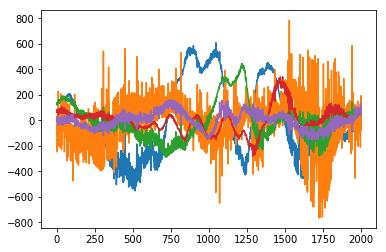

In [39]:
raw_pca = pca(raw[1000:3000],5)
p = raw_pca.transform(raw[1000:3000])
f = plt.plot(p)

2000


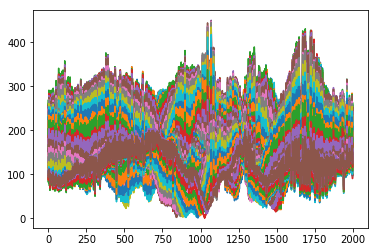

In [71]:
start = 1000
capture = raw[start : start+2000]
f = plt.plot(capture)
print(len(capture))

In [72]:
for TX in range(1, 3):
    print("TX:", TX)
    filename = "data/" + action + "-" + str(data_num) + "/csv" + str(TX) + "x" + str(RX) + ".csv"
    data_path = "capture/" + action + "-" + str(data_num)  + "-" + str(TX) + ".csv"
    raw = load_data(filename)
    preprocess = pre_slope_std(raw)
    capture = preprocess[start : start+2000]
    cap_save(capture, data_path)
#data_path = "capture/" + action + "-" + str(data_num)  + "-" + str(TX) + ".csv"
#cap_save(capture, data_path)

TX: 1
TX: 2
